# Data Visualization Using Python

# Part 1: Introduction, matplotlib and plotly

## 0. Introduction
Until now, we have worked with Arduino, Raspberry Pi, APIs, python, with a common objective: retrieve data for a specific purpose. Using data, we can observe how is the behavior of the loads we are controlling and we can schedule their operation according to some specific signals, such as light intensity, market prices, time, etc. 

A useful way to see that the load is behaving in the way we want is by using data visualization tools. Data visualization has become a key activity in companies to extract conclusions and define the next steps of the company.

In this session, we will use a wind turbine dataset, using data shared by DTU at the following DOIs: 10.11583/DTU.7856891 and 10.11583/DTU.7856888. We will have historical observations of V52 Wind turbine. We will work with historical observations, using a csv file. 

![V52 Wind Turbine](./images/v52turbine_3.jpg)

We will use different Python libraries to visualize these data. Specifically, the libraries used in this lab session will be matplotlib, plotly and Dash. 

## 1. Set Up
### 1.1. Importing Libraries



In [1]:
# data processing
import pandas as pd 
# numerical library 
import numpy as np
# timer, dates
import datetime
# data visualization libraries
import matplotlib.pyplot as plt 

### 1.2. Loading Data

In [2]:
df = pd.read_csv('./data/V52_ExtensiveData.csv', sep='\t', skiprows=12)

*Important note*: before importing a file into memory in your computing environment, do check the typew of file you are importing. Most times the file extensions are not very descriptive. For instance, in this case we are importing a .csv file. Notice that the import process is effective only when the *separator* parameter is specified, otherwise the pandas dataframe would  not understand correctly the structure of data (try yourself removing the separator to see what happens).
This is because the original file containing data is not a *"comma separated value* (.csv) file, but in fact a *tab separated value* (.tsv). You can easily verify this by opening the file with a text editor. This is always a good practice before starting the analysis of a dataset.
By doing this, you can even realize that the first 12 rows are in fact useless and can be ignored in the import process.

## 2. Data Pre-processing
### 2.1. First look at the dataset

Have a quick look at the dataset and understand basic things like the **features** contained in the dataset (represented by the columns) and the number of **observations** (number of elements) in the dataset.
This commands are pretty useful for a first quick look:

In [3]:
df.head()

,Date,Wsp_44m,Wdir_41m,ActPow,RePow,ActPow_std,Wsp_44m_std,Wdir_41m_std,stability
0,201801010000,4.71803,200.743,64.6673,0.000860,33.4251,0.566131,6.45730,1.0
1,201801010010,5.44100,201.768,70.8152,-0.000657,26.3829,0.765691,6.66940,1.0
2,201801010020,5.32178,197.962,80.8037,-0.000617,30.2002,0.603442,6.99113,1.0
3,201801010030,5.95325,204.606,86.1123,-0.002370,43.1192,0.872915,5.47062,1.0
4,201801010040,6.17765,204.398,110.8570,0.001033,29.9507,0.550160,4.93713,1.0


In [8]:
df.shape
df.tail()

,Date,Wsp_44m,Wdir_41m,ActPow,RePow,ActPow_std,Wsp_44m_std,Wdir_41m_std,stability
52236,201812312320,12.1482,253.122,759.568,0.002660,97.1320,1.24760,4.92719,1.0
52237,201812312330,11.7745,251.680,740.596,-0.000067,85.9112,1.50046,4.93747,1.0
52238,201812312340,10.8304,252.815,632.185,0.001230,145.5360,1.35453,5.11597,1.0
52239,201812312350,10.0751,252.329,547.601,0.010070,166.0810,1.22376,6.17107,1.0
52240,201901010000,10.1756,252.991,506.603,-0.035340,120.0710,1.29565,6.04011,1.0


In [7]:
df.dtypes

Date              int64
Wsp_44m         float64
Wdir_41m        float64
ActPow          float64
RePow           float64
ActPow_std      float64
Wsp_44m_std     float64
Wdir_41m_std    float64
stability       float64
dtype: object

Questions for you: 

1. How many rows do we have? -> 52241
2. Which types of variables do we have? -> Date = int (needs to be transfered into datetime), Stability to Boolean, others are float
3. What’s the shape of the Dataframe? -> (52241,9)
4. Which data-types does the Dataframe have? -> pandas.core.frame.DataFrame -> Pandas DataFrame
5. Are all the columns in the right format? -> no, Date needs to be transfered to datetime. Stability to Boolean.
6. Do we have to change any of the data-types? -> Date needs to be transfered to datetime. Stability to Boolean.
7. Are the columns' name useful for us? What's the information they are trying to tell us? Yes. But, {}_std varable are a bit unclear. Maybe a standadized value? 
8. Do you know the units of measurement? no. (look up in Paper)
9. For how long have we been taking data? for one year (2018 to 2019)
10. What’s the time granularity? every 10min?
11. What do these data tell us? (storytelling...) -> giving the Wind condition, what power measurements ahve been seen.

### 2.2. Changing columns' type

In [9]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y%m%d%H%M')

In [10]:
df.head()

,Date,Wsp_44m,Wdir_41m,ActPow,RePow,ActPow_std,Wsp_44m_std,Wdir_41m_std,stability
0,2018-01-01 00:00:00,4.71803,200.743,64.6673,0.000860,33.4251,0.566131,6.45730,1.0
1,2018-01-01 00:10:00,5.44100,201.768,70.8152,-0.000657,26.3829,0.765691,6.66940,1.0
2,2018-01-01 00:20:00,5.32178,197.962,80.8037,-0.000617,30.2002,0.603442,6.99113,1.0
3,2018-01-01 00:30:00,5.95325,204.606,86.1123,-0.002370,43.1192,0.872915,5.47062,1.0
4,2018-01-01 00:40:00,6.17765,204.398,110.8570,0.001033,29.9507,0.550160,4.93713,1.0


This is a typical step to do when working with time-series data. Converting from numerical format *float64* to the pyhton date-type format *datetime*

### 2.3. Check for missing data (NaN)

Check if Not a Number values are present.

In [11]:
# for each column
df.isna().sum()

Date               0
Wsp_44m         3253
Wdir_41m        3253
ActPow           138
RePow            138
ActPow_std       138
Wsp_44m_std     3253
Wdir_41m_std    3253
stability          0
dtype: int64

In [12]:
# overall 
df.isna().sum().sum()

13426

Let's try to visualize the rows where NaN values are.

In [13]:
bool = pd.isnull(df["Wsp_44m"])
df[bool]

,Date,Wsp_44m,Wdir_41m,ActPow,RePow,ActPow_std,Wsp_44m_std,Wdir_41m_std,stability
19015,2018-05-14 09:20:00,NaN,NaN,-1.096810,-1.285870,1.004990,NaN,NaN,0.0
19016,2018-05-14 09:30:00,NaN,NaN,-1.030800,-0.895310,0.982677,NaN,NaN,0.0
19017,2018-05-14 09:40:00,NaN,NaN,-0.903863,-0.680247,0.716444,NaN,NaN,0.0
19018,2018-05-14 09:50:00,NaN,NaN,-0.823533,-0.763457,0.782019,NaN,NaN,0.0
19019,2018-05-14 10:00:00,NaN,NaN,-0.975510,-0.802763,0.841965,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...
27102,2018-07-09 13:00:00,NaN,NaN,201.837000,-0.001510,67.718100,NaN,NaN,0.0
27103,2018-07-09 13:20:00,NaN,NaN,220.969000,-0.006363,51.026400,NaN,NaN,0.0
27104,2018-07-09 13:30:00,NaN,NaN,18.443400,0.800440,65.841100,NaN,NaN,0.0
27105,2018-07-09 13:40:00,NaN,NaN,-1.544820,-1.853780,0.819548,NaN,NaN,0.0


In [14]:
bool = pd.isnull(df["ActPow"])
df[bool]

,Date,Wsp_44m,Wdir_41m,ActPow,RePow,ActPow_std,Wsp_44m_std,Wdir_41m_std,stability
395,2018-01-03 18:30:00,4.11082,166.586,NaN,NaN,NaN,0.877951,9.456860,0.0
3413,2018-01-23 23:30:00,11.35410,196.849,NaN,NaN,NaN,0.451371,2.592660,1.0
3414,2018-01-23 23:40:00,11.43910,197.141,NaN,NaN,NaN,0.000005,0.000000,1.0
3415,2018-01-23 23:50:00,11.43910,197.141,NaN,NaN,NaN,0.000005,0.000000,1.0
3416,2018-01-24 00:00:00,11.43910,197.141,NaN,NaN,NaN,0.000005,0.000000,1.0
...,...,...,...,...,...,...,...,...,...
42393,2018-10-24 07:30:00,14.33320,332.584,NaN,NaN,NaN,0.000009,0.000058,1.0
42394,2018-10-24 07:40:00,14.33320,332.584,NaN,NaN,NaN,0.000009,0.000058,1.0
42395,2018-10-24 07:50:00,14.33320,332.584,NaN,NaN,NaN,0.000009,0.000058,1.0
42396,2018-10-24 08:00:00,14.33320,332.584,NaN,NaN,NaN,0.000009,0.000058,1.0


Yes, many NaN are present in the dataset. How to treat them? Ideally, each variable should be treated separately in the most meanigful way.

In [15]:
# storing the indexes of rows with NaN values
rows_nan = df[bool].index

In [16]:
# replace with a specific value
df_replaced = df.replace(to_replace = np.nan, value = -99)
df_replaced.isna().sum().sum()

0

In [17]:
# take a look at the changes
df_replaced.loc[rows_nan]

,Date,Wsp_44m,Wdir_41m,ActPow,RePow,ActPow_std,Wsp_44m_std,Wdir_41m_std,stability
395,2018-01-03 18:30:00,4.11082,166.586,-99.0,-99.0,-99.0,0.877951,9.456860,0.0
3413,2018-01-23 23:30:00,11.35410,196.849,-99.0,-99.0,-99.0,0.451371,2.592660,1.0
3414,2018-01-23 23:40:00,11.43910,197.141,-99.0,-99.0,-99.0,0.000005,0.000000,1.0
3415,2018-01-23 23:50:00,11.43910,197.141,-99.0,-99.0,-99.0,0.000005,0.000000,1.0
3416,2018-01-24 00:00:00,11.43910,197.141,-99.0,-99.0,-99.0,0.000005,0.000000,1.0
...,...,...,...,...,...,...,...,...,...
42393,2018-10-24 07:30:00,14.33320,332.584,-99.0,-99.0,-99.0,0.000009,0.000058,1.0
42394,2018-10-24 07:40:00,14.33320,332.584,-99.0,-99.0,-99.0,0.000009,0.000058,1.0
42395,2018-10-24 07:50:00,14.33320,332.584,-99.0,-99.0,-99.0,0.000009,0.000058,1.0
42396,2018-10-24 08:00:00,14.33320,332.584,-99.0,-99.0,-99.0,0.000009,0.000058,1.0


A more powerful approach is to replace the NaN with interpolation techniques. These can follows several methods, linear, polynomial, etc. Take a look at the pandas documentation online for all the options. Take the most suited to your case.

In [18]:
# replace with interpolation (linear)
df_int = df.iloc[:,1:].interpolate(method ='linear', limit_direction ='forward')
# NB: interpolate works only with numerical type data (need to exclude the "Date" column)
# take a look at the changes
df_int.loc[rows_nan]

,Wsp_44m,Wdir_41m,ActPow,RePow,ActPow_std,Wsp_44m_std,Wdir_41m_std,stability
395,4.11082,166.586,77.718400,-0.000213,22.161700,0.877951,9.456860,0.0
3413,11.35410,196.849,89.048351,-0.000944,50.281267,0.451371,2.592660,1.0
3414,11.43910,197.141,89.353301,-0.000957,50.425235,0.000005,0.000000,1.0
3415,11.43910,197.141,89.658252,-0.000971,50.569202,0.000005,0.000000,1.0
3416,11.43910,197.141,89.963202,-0.000985,50.713170,0.000005,0.000000,1.0
...,...,...,...,...,...,...,...,...
42393,14.33320,332.584,-0.419373,0.439353,0.466145,0.000009,0.000058,1.0
42394,14.33320,332.584,-0.403087,0.425486,0.444208,0.000009,0.000058,1.0
42395,14.33320,332.584,-0.386801,0.411620,0.422270,0.000009,0.000058,1.0
42396,14.33320,332.584,-0.370515,0.397753,0.400332,0.000009,0.000058,1.0


Alternatively, we can "pad" values, meaning using the values of the previous rows. This is possible through the `fillna` method which has different options. Take a look at the documentation to understand the better for you.

In [19]:
# filling a missing value with previous ones 
df_pad = df.fillna(method ='pad')
# take a look at the changes
df_pad.loc[rows_nan]

,Date,Wsp_44m,Wdir_41m,ActPow,RePow,ActPow_std,Wsp_44m_std,Wdir_41m_std,stability
395,2018-01-03 18:30:00,4.11082,166.586,63.56970,-0.001013,15.18260,0.877951,9.456860,0.0
3413,2018-01-23 23:30:00,11.35410,196.849,88.74340,-0.000930,50.13730,0.451371,2.592660,1.0
3414,2018-01-23 23:40:00,11.43910,197.141,88.74340,-0.000930,50.13730,0.000005,0.000000,1.0
3415,2018-01-23 23:50:00,11.43910,197.141,88.74340,-0.000930,50.13730,0.000005,0.000000,1.0
3416,2018-01-24 00:00:00,11.43910,197.141,88.74340,-0.000930,50.13730,0.000005,0.000000,1.0
...,...,...,...,...,...,...,...,...,...
42393,2018-10-24 07:30:00,14.33320,332.584,-1.15224,1.063350,1.45334,0.000009,0.000058,1.0
42394,2018-10-24 07:40:00,14.33320,332.584,-1.15224,1.063350,1.45334,0.000009,0.000058,1.0
42395,2018-10-24 07:50:00,14.33320,332.584,-1.15224,1.063350,1.45334,0.000009,0.000058,1.0
42396,2018-10-24 08:00:00,14.33320,332.584,-1.15224,1.063350,1.45334,0.000009,0.000058,1.0


Lastly, we can drop the NaN values. This is acceptable if the dataset has lot of observations.

In [20]:
df_drop = df.dropna()

# check 
print("Old data frame length:", len(df))
print("New data frame length:", len(df_drop))
print("Number of rows with at least 1 NA value: ", (len(df)-len(df_drop)))

Old data frame length: 52241
New data frame length: 48850
Number of rows with at least 1 NA value:  3391


In [21]:
# choose the approach to go on
df = df_drop

### 2.4. Exploratory Data Analysis (EDA)

First let's plot a summary of the dataset under analysis

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48850 entries, 0 to 52240
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          48850 non-null  datetime64[ns]
 1   Wsp_44m       48850 non-null  float64       
 2   Wdir_41m      48850 non-null  float64       
 3   ActPow        48850 non-null  float64       
 4   RePow         48850 non-null  float64       
 5   ActPow_std    48850 non-null  float64       
 6   Wsp_44m_std   48850 non-null  float64       
 7   Wdir_41m_std  48850 non-null  float64       
 8   stability     48850 non-null  float64       
dtypes: datetime64[ns](1), float64(8)
memory usage: 3.7 MB


A short summary of statistical quantities. Here, measures of measures of central tendency are summarized for each variable

In [23]:
df.describe()

,Wsp_44m,Wdir_41m,ActPow,RePow,ActPow_std,Wsp_44m_std,Wdir_41m_std,stability
count,48850.000000,48850.000000,48850.000000,48850.000000,48850.000000,48850.000000,48850.000000,48850.000000
mean,5.576675,192.635707,144.472955,-0.068813,37.861227,0.826052,8.409560,0.546551
std,2.776049,88.923497,207.577375,0.616599,46.892570,0.519013,4.727177,0.497833
min,0.503833,0.001286,-27.466700,-5.744410,0.000000,0.000000,0.000000,0.000000
25%,3.622665,124.865250,-0.390690,-0.002633,0.714484,0.446510,5.612315,0.000000
50%,5.175870,198.935000,60.128300,-0.000510,22.103300,0.722568,7.410195,1.000000
75%,7.055505,266.137750,183.379000,0.002380,54.066950,1.094393,9.740340,1.000000
max,19.720000,359.997000,867.900000,11.800000,408.458000,4.028130,57.136100,1.000000


A useful tool to perform a quick-and-dirty exploratory data analysis is the **pairplot**. Here available with the *seaborn* library. This command create a multiple chart with every feature plotted against all the others. In the matrix-style in which the plot is presented, the diagonal *(i,i)* is filled with the probability density function of the respective variable *i*, highlighting its distribution.
NB: mind that this command takes time

## 3. Creating plots using seaborn

In [24]:
import seaborn as sns
sns.set()

In [25]:
indp_vars = df.iloc[:, 1:]
indp_vars.head()

,Wsp_44m,Wdir_41m,ActPow,RePow,ActPow_std,Wsp_44m_std,Wdir_41m_std,stability
0,4.71803,200.743,64.6673,0.000860,33.4251,0.566131,6.45730,1.0
1,5.44100,201.768,70.8152,-0.000657,26.3829,0.765691,6.66940,1.0
2,5.32178,197.962,80.8037,-0.000617,30.2002,0.603442,6.99113,1.0
3,5.95325,204.606,86.1123,-0.002370,43.1192,0.872915,5.47062,1.0
4,6.17765,204.398,110.8570,0.001033,29.9507,0.550160,4.93713,1.0


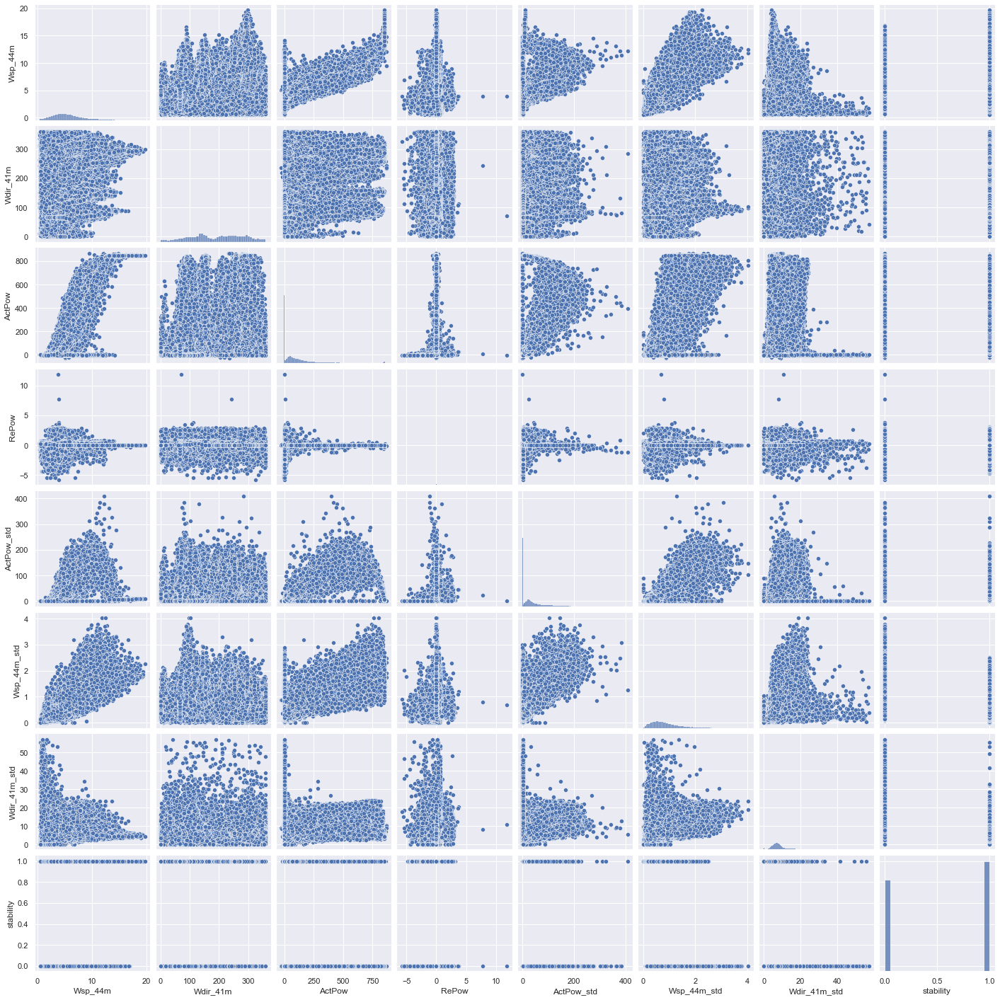

In [26]:
sns.pairplot(indp_vars)

Is there anything we can conclude from this first view?

## 4. Creating plots using matplotlib

#### 2.3.1 Univariate analysis

Univariate analysis is the simplest form of analyzing data. Your data has only one variable. It doesn't deal with causes or relationships and it's major purpose is to describe. It takes data, summarizes that data and finds patterns in the data.

The univariate analysis is particularly useful in the case of categorical variables. In our case the dataset only contains numerical variables. Among these numerical variables, almost all of them are **time-series** data therefore with a unique time dependency.

In [27]:
# stability var
count = df['stability'].value_counts()
count

1.0    26699
0.0    22151
Name: stability, dtype: int64

What is the best chart to plot the stability variable? A **barplot** would work.

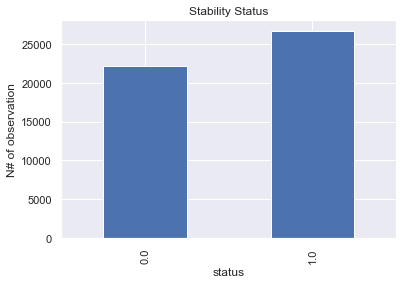

In [28]:
plt.figure()
count.sort_index().plot(kind='bar')
plt.title('Stability Status')
plt.xlabel('status')
plt.ylabel('N# of observation')
plt.show()

#### 2.3.2 Bivariate analysis

Bivariate analysis is one of the simplest forms of quantitative (statistical) analysis. It involves the analysis of two variables (often denoted as X, Y), for the purpose of determining the empirical relationship between them. 

It is clear that given our dataset, the first dependent variable Y to analyse would be the **Date**, and the other indipendent variables X would be the other features.

Choose the variables you want to plot

In [38]:
df.head()
max(df['ActPow_std'])

867.9

You can start by trying out this quick plots

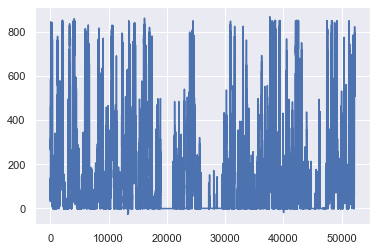

In [30]:
plt.plot(df['ActPow'])
plt.show()

You can clearly see the "holes" generated by removing NaN values

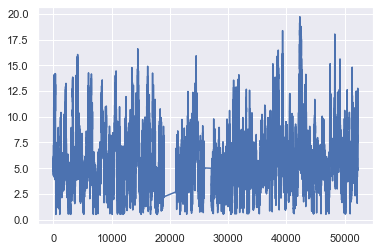

In [31]:
plt.plot(df['Wsp_44m'])
plt.show()

For a better visualization, you can improve your plotting code as this example

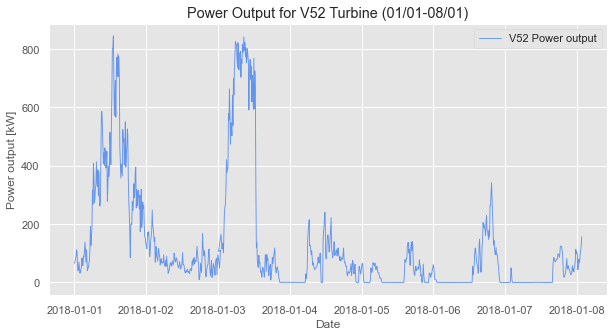

In [32]:
plt.style.use('ggplot')
plt.figure(figsize=(10,5))
plt.plot(df['Date'][0:6*24*7], df['ActPow'][0:6*24*7], linewidth=0.9, color= 'cornflowerblue') # first x-axis then y-axis
plt.title('Power Output for V52 Turbine (01/01-08/01)')
plt.xlabel('Date')
plt.ylabel('Power output [kW]')
plt.legend(['V52 Power output'])
plt.savefig('./images/V52_Plot.png', dpi=300)
plt.show()

# NB: if you want to both plot in console and save the figure you should place *plt.show()* only after the *savefig* command

Let's try some different plots. Commands and possibilities are almost infinite. Go and check out https://www.python-graph-gallery.com/ for some suggestions/inspiration on which plot to choose and how to generate it in python! The tool is really helpul and gives already pre-made working code.

Here follows, for example a **distribution plot** which basically a continous **hystogram** of the variable and plots the probability density function.

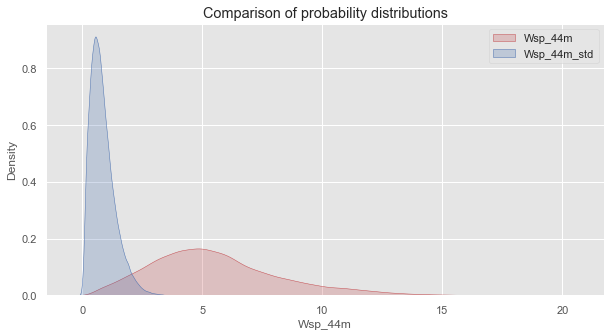

In [33]:
# plotting both distibutions on the same figure
plt.figure(figsize=(10,5))
plt.title('Comparison of probability distributions')
fig = sns.kdeplot(df['Wsp_44m'], shade=True, color="r", label="Wsp_44m") # Seaborn library
fig = sns.kdeplot(df['Wsp_44m_std'], shade=True, color="b", label="Wsp_44m_std")
plt.legend()
plt.show()

In [34]:
df.head()

,Date,Wsp_44m,Wdir_41m,ActPow,RePow,ActPow_std,Wsp_44m_std,Wdir_41m_std,stability
0,2018-01-01 00:00:00,4.71803,200.743,64.6673,0.000860,33.4251,0.566131,6.45730,1.0
1,2018-01-01 00:10:00,5.44100,201.768,70.8152,-0.000657,26.3829,0.765691,6.66940,1.0
2,2018-01-01 00:20:00,5.32178,197.962,80.8037,-0.000617,30.2002,0.603442,6.99113,1.0
3,2018-01-01 00:30:00,5.95325,204.606,86.1123,-0.002370,43.1192,0.872915,5.47062,1.0
4,2018-01-01 00:40:00,6.17765,204.398,110.8570,0.001033,29.9507,0.550160,4.93713,1.0


## Exercize: try it yourself

Try to plot yourself and save others time-dependent variables with **matplotlib** and **seaborn**:

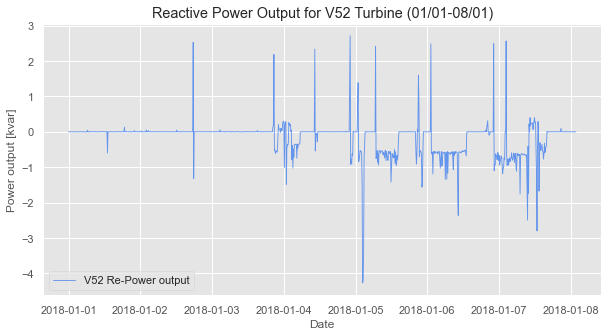

In [35]:
# Var RePow
# Your code here: 

plt.style.use('ggplot')
plt.figure(figsize=(10,5))
plt.plot(df['Date'][0:6*24*7], df['RePow'][0:6*24*7], linewidth=0.9, color= 'cornflowerblue') # first x-axis then y-axis
plt.title('Reactive Power Output for V52 Turbine (01/01-08/01)')
plt.xlabel('Date')
plt.ylabel('Power output [kvar]')
plt.legend(['V52 Re-Power output'])
plt.savefig('./images/RePow_V52_Plot.png', dpi=300)
plt.show()


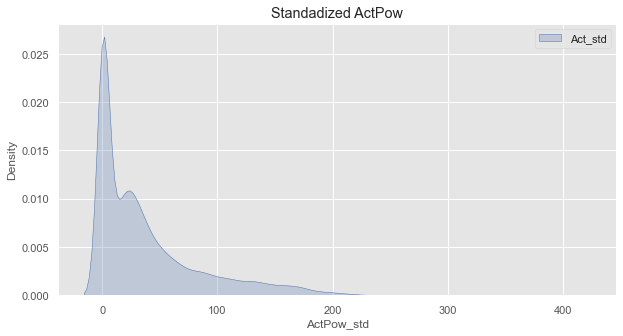

In [36]:
# Var ActPow_std
# Your code here: 

plt.figure(figsize=(10,5))
plt.title('Standadized ActPow')
fig = sns.kdeplot(df['ActPow_std'], shade=True, color="b", label="Act_std")
plt.legend()
plt.show()


Try now to plot all the wind data in the same chart

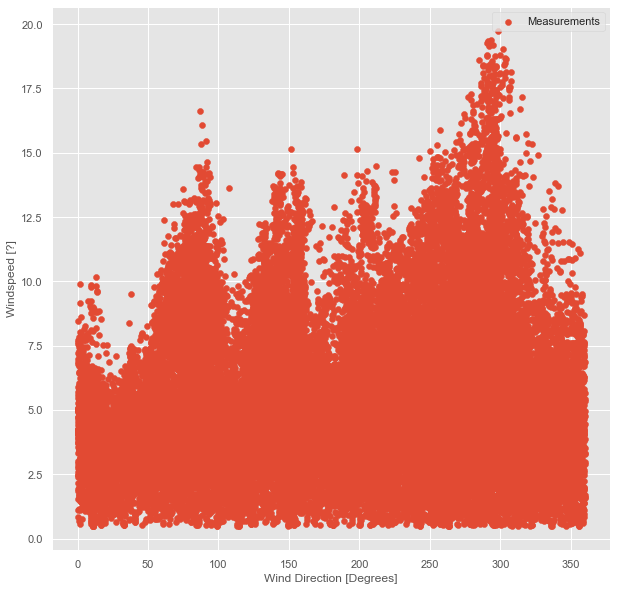

In [46]:
# Your code here: 

plt.figure(figsize=(10,10))
plt.scatter(df['Wdir_41m'], df['Wsp_44m'])
plt.xlabel('Wind Direction [Degrees]')
plt.ylabel('Windspeed [?]')
plt.legend(['Measurements'])
plt.show()

# From this graph we see 

Try now to plot all both active power and reactive power in the same chart

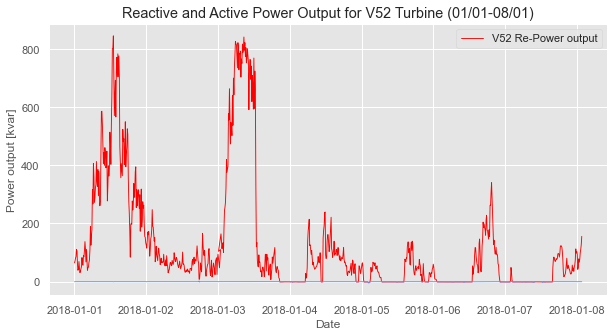

In [47]:
# Your code here: 

plt.style.use('ggplot')
plt.figure(figsize=(10,5))
plt.plot(df['Date'][0:6*24*7], df['ActPow'][0:6*24*7], linewidth=0.9, color= 'red') # first x-axis then y-axis
plt.plot(df['Date'][0:6*24*7], df['RePow'][0:6*24*7], linewidth=0.9, color= 'cornflowerblue') # first x-axis then y-axis
plt.title('Reactive and Active Power Output for V52 Turbine (01/01-08/01)')
plt.xlabel('Date')
plt.ylabel('Power output [kvar]')
plt.legend(['V52 Re-Power output'])
plt.savefig('./images/RePow_ActPow_V52_Plot.png', dpi=300)
plt.show()

#NEEDS TO BE CHANGED !!! maybe right y-axis different


Try now to work with subplots, put mopre plots in the same figure

In [ ]:
# Your code here: 




## 5. Interactive data visualization: Plotly

In [48]:
# plotly library for interacive plots
import plotly.offline as py
from plotly import tools
import plotly.graph_objs as go
import warnings
from ipywidgets import widgets
from ipywidgets import interact

# plotly settings to ignore warnings
warnings.filterwarnings('ignore')
py.init_notebook_mode(connected=True)

A plotly chart consist basically in 3 objects: traces, layout and the figure itself. The traces are the single subjects/signals to be plotted. More traces may exist in a single plot of course. The layout is the object which stores the plotting details and styles. The figure is the wrapper that contains everything. Let's dig into it step by step.

In [49]:
# create traces
trace1 = go.Scatter(
             x = df['Date'],
             y = df['Wsp_44m'],
             mode = 'lines',
             name = 'Speed')

trace2 = go.Scatter(
            x = df['Date'],
            y = df['Wdir_41m'],
            mode = 'lines',
            name = 'Direction')

In [50]:
# create layout
layout = go.Layout(
    title = "Wind Information",
    xaxis = {'title' : "Date"},
    yaxis = {'title' : "Value"})


Note that the layout object wants python `dictionaries` to store the details

In [51]:
# create figure
fig = go.Figure(data=[trace1, trace2], layout=layout)
# show figure
fig.show()

You can also directly define the plotly figure structure containing the objects. 
Mind that only the first 7 days are selected for plotting for the sake of the representation.

In [52]:
x_time = df['Date'][0:6*24*7]                       # change numbers in brackets to change dates
y_data = df['ActPow'][0:6*24*7]                     # change numbers in brackets to change dates

fig = go.Figure(    # the "data" is a list containing the details of the traces
        data=[
            # first trace
            go.Line(x=x_time,                          
                    y=y_data, 
                    name="V52")
        # other traces if needed
        ],
        # layout
        layout=go.Layout(
            title=dict(text='Weekly V52 Turbine Power Output'),
            xaxis=dict(title='Date'),
            yaxis=dict(title='Power Output [kW]')
        )
    )
fig.show()

/Users/bendiksherbold/opt/anaconda3/lib/python3.9/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




If you want to save it locally you can do it in HTML format (to be opened in your browser)

In [53]:
fig.write_html(".\images\ActPowVSDate_simple.html") # Now HTML because its interactive

If you want to compare more signals and improve the quality of your chart you can use the following code.
The poltly library uses the **figure** structure to contain the elements of the chart.
The structure can contain **traces**, where new elements are contained and added to the chart, and **layouts**, which contains information on descriptive elements of the chart.
Let's have a look at the following example, comparing *active power* versus *reactive power* in the same chart.

You can also use the method `add_trace` or `update_layout` to add those objects to an already created `fig` object. It is exactly the same thing as before. Use the method you prefer.

In [54]:
# Creating figure with Plotly
fig = go.Figure()

# Adding first line for active power
x_time = df['Date'][0:6*24*7]
y_data1 = df['ActPow'][0:6*24*7]

fig.add_trace(go.Line(x=x_time,
                      y=y_data1, 
                      name="Active Power"));

# Adding second line for reactive power
x_time = df['Date'][0:6*24*7]
y_data2 = df['RePow'][0:6*24*7]

fig.add_trace(go.Line(x=x_time,
                      y=y_data2, 
                      name="Reactive Power",
                      # you can add some costumizations
                      line = dict(color='lightcoral', width=2, dash='dot')));

# Setting aesthetics for the plot such as Title and axes labels. 
fig.update_layout(
    title=go.layout.Title(text="V52 Wind turbine", xref="paper", x=0, 
                          font=dict(family="Courier New, monospace", size=18, color="#7f7f7f")),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Date", font=dict(family="Courier New, monospace",
                          size=18, color="#7f7f7f"))),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Active Power [kW] Reactive Power [kvar]",
                          font=dict(family="Courier New, monospace", size=18, color="#7f7f7f"))))

fig.show()
fig.write_html(".\images\ActPowVSRePow.html")

## Exercize: try it yourself

Try to plot yourself and save others time-dependent variables with **plotly**:

In [56]:
# choose your variable/variables to be plotted
# Your code here: 

# create traces
trace1 = go.Scatter(
             x = df['Date'],
             y = df['Wsp_44m_std'],
             mode = 'lines',
             name = 'Speed')

trace2 = go.Scatter(
            x = df['Date'],
            y = df['Wdir_41m_std'],
            mode = 'lines',
            name = 'Direction')

# create layout
layout = go.Layout(
    title = "Wind Information",
    xaxis = {'title' : "Date"},
    yaxis = {'title' : "Value"})

# create figure
fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.write_html(".\images\WindComp_std.html")

# show figure
fig.show()


In [ ]:
# choose your variable/variables to be plotted
# Your code here: 

Try to create always more complicated and particular plots with the given data.

In [ ]:
# choose a creative plot with the given data
# Your code here: 

## 6. Data Storytelling

In the meanwhile you are trying out some plotting looking at the code above, do not forget to use your own creativity and analysis skills to understand what these data can tell us. Try to look for patterns/correlation between the variables, there might be some interesting facts/stories to tell! Do not forget that the very first powerfull machine learning algorithm is the human mind! And data visualization is the tool which makes this possible.

NB: works which investigate, find and properly put in practice data storytelling will get higher marks!

# Part 2: Web Dashboard App with Streamlit

In this part of the lab we are goint to take the data visualization to the next level. Lately, many easy-to-use frameworks to improve data visualization have risen, in particular linked with high level and flexible programming languages like python. **Streamlit** is one those, designed specifically with the idea to be easy to learn. Streamlit is an open source python based framework for developing and deploying interactive data science dashboards and machine learning models.
With only a few lines of pyhton code it is possible to build awesome interactive dashboards for data visualization. 

https://streamlit.io/

Checking out the documentation is strongly advised for those who are beginners and needs assistance with the installation. Docs to get started are available [here](https://docs.streamlit.io/library/get-started).

Streamlit also offers a free hosting service for applications in their website. We are going to use this to deploy (for free) our web apps for data visualization and be able to access them anytime online!

Pre-requisites to run this part of lab:

- A working installation of **python (3.7 - 3.10)** on your machine
- An integrated development environment (**IDE**) of your choice is highly recommended
- A personal **GitHub** repository

Note that the following steps are done *outside* this jupyter notebook as do not involve any coding. 

1) **Set up a new virtual environment**. It is good practice to do so when starting a new project. You can create it with **anaconda** or with the package/environment manager you are using.

2) Install the **streamlit** package in the newly created virtual environment.

3) Install also a couple of others packages for convenience, that we will need to work (*matplotlib, seaborn, plotly, numpy, pandas, plost etc*).

4) Go the streamlit website and register a new user.

Now we are all set to start building our web app with some code. To help you at this stage it could be quicker to take a pre-made template of a web dashboards to better understand how it is done. Later on , we will costumize it to load our own flow of data. 

5) Go to [this](https://github.com/andreabragantini/streamlit_test)  GitHub repository and **fork** it on your personal GitHub account. You will have an exact copy of it.

6) You can already have a look at the template dashboard by going to your streamlit personal account and add a `New App` pointing directly to your personal GitHub repository that you have just forked. You'll see the app working and deployed on streamlit servers!

Let's now proceeding by taking a look at the code of the streamlit app with the purpose of creating our own web dashboard app.

6) **Clone** the repository on your local machine and open the files in the IDE of your choice.

7) Make your own modification to the code and to take a look at the changes right away, you need to open a **terminal window**, go to directory where your streamlit project is stored and run `streamlit run your_script.py`. As soon as you run the script as shown above, a **local Streamlit server** will spin up and your app will open in a new tab in your default web browser. The app is your canvas, where you'll draw charts, text, widgets, tables, and more.

8) When you are finally satisfied with the edits, just **commit and push** to your own repository where the code is stored and the streamlit web server will automatically **deploy** the new edited dashboard!

The basic requirements for this part of the lab are: to be able to create a working web app following the given instructions and online guides, be able move yourself betweeen GitHub and your local IDE and finally, accomplish some minor changes to the given web app template. Works that goes beyond this will get a generous plus!

# Part 3: Home Exercize 1

Taking back the concepts seen during LAB 3 about how to stream online data from API, I want you to take one free API of your choice (available in RapidAPI marketplace for instance) and create some visualization artifacts with the library the you prefer.

The most creative and fancy work wins it all! Enjoy plotting ;) 

# Part 4: Home Exercize 2

This exercize is thought for improving your data analysis and data preparation skills. Look at the first part of the lab done in the class and repeat the same passages with a new "unseen" dataset which you dont know. 

In the data folder you can find the dataset: *house_price.csv*. This dataset provides data regarding the USA house market, it is a very famous dataset for data science and machine learning exercizes. In particular, for each house (observations) available in the market there are variables describing its characteristics and its price.

The task is to repeat the steps done in the class lab activity and come up with a short data analysis of the given dataset. The focus of the analysis is the storytelling which should be backed with proper plots and charts.

Try to pay attention to **data storytelling**. What do you think the variable price is driven by? Look for some patterns...

In [ ]:
# Set up and data loading
# Your code here

In [ ]:
# Data preprocessing (if, needed)
# Your code here

In [ ]:
# Univariate analysis
# Your code here

In [ ]:
# Bivariate analysis
# Your code here

# Part 5: Home Exercize 3

If you have not been able to finish in class, build the web dashboard app of your dreams with **streamlit**! 
Use an API of your choice to get data and think about the visualization needs of your project. Take the most out of the tools that you have tested in class! Enjoy.

PS: send me the link to the web dashboard for evaluation, by default it should be opened to everyone who got the url.